# 와서스테인 손실 함수
와서스테인 손실함수는 DCGAN이 0 또는 1을 사용하는 반면에 $y_{i} = 1$ 또는 $y_{i} = -1$ 을 사용한다. 그리고 판별자의 마지막 층에서 사그모이드 활성화 함수를 제거하여 예측 $p_{i}$가 [0, 1] 범위에 국한되지 않고 $[-\infty, \infty]$ 범위에서 어떤 수도 되게끔 합니다. 그래서 WGAN의 판별자는 비평자라 불린다. 확률 대신 점수를 반환하는 것이 특징입니다.

$$
\frac{-1}{n}\sum^{n}_{i=1}(y_{i}p_{i})
$$

DCGAN에서 D(x)는 판별자가 입력 x(이미지)를 진짜 또는 가짜라고 할 확률, D(G(Z))는 생성자가 잠재공간을 통해 생성한 이미지를 판별자에 넣었을 때 판별자가 진짜 또는 가짜라고 할 확률 입니다.
WGAN에서는 판별자 D를 학습하기 위해 $p_{i}=D(x_{i})$와 $y_{i}=1$를 비교하고 생성한 이미지에 대한 $p_{i}=D(G(z_{i}))$와 $y_{i}=-1$를 비교하여 손실을 계산합니다. 

위 수식을 이용해서 이용해서 WGAN의 손실함수를 설계해보면 다음과 같습니다
다음은 판별자의 손실함수 입니다.
$$
\underset{D}{Min} = -(E_{x \char`\~ p_{x}(x)}[D(x)] - E_{z \char`\~ p_{z}(z)}[D(G(z))])
$$


$\underset{D}{Min} -(E_{x \char`\~ p_{x}(x)}[D(x)] - E_{z \char`\~ p_{z}(z)}[D(G(z))])$ 항은 실제데이터 x와 생성된 데이터 G(z)사이의 와서스테인 거리를 최소화 하도록 합니다. 즉 진짜 이미지와 생성된 이미지에 대한 예측 차이를 최소화 하는 방향으로 학습되게 됩니다. 

반면에 생성자의 손실함수는 다음과 같습니다.
$$
\underset{G}{Min} = -E_{z \char`\~ p_{z}(z)}[D(G(z))]
$$

생성자는 비평자로부터 가능한 한 높은 점수를 받는 이미지를 생성하게끔 설계합니다. G(z)는 노이즈로부터 생성한 이미지로 D(G(z))가 최대화되야 되므로 이는 음수로 만들어 최소화되게 하는 문제와 동일해집니다.

# 
## 립시츠 제약
### 배경 지식
#### 립시츠 연속성
함수의 출력 변화가 입력 변화에 비례하도록 제한하는 성질을 의미합니다. 함수가 Lipschitz 연속성을 가진다면, 입력값이 조금 변할 때 함수의 출력값도 일정한 비율로만 변하며, 너무 급격하게 변화하지 않도록 제어됩니다. 이는 수학적 연속성의 한 형태로, 특히 함수의 변화가 너무 크거나 불안정해지는 것을 방지합니다. 다음 부등식을 만족할 때 립시츠 연속성을 가진다고 말합니다. 이때 K=1일 때를 1-립시츠 연속성이라고 합니다.
$$
\frac{D(x_{1}) - D(x_{2})}{x_{1} - x_{2}} \leq K
$$
#### 립시츠 함수
립시츠 연속성을 만족하는 함수로 입력값의 작은 변화에 따라 출력값의 변화가 일정한 상수 비율을 넘지 않도록 제한된 함수입니다. 이 함수는 급격하게 변화하지 않고 일정한 속도로 변화하도록 제어된 함수로, 안정적인 특성을 가지고 있습니다. 이때 일정한 상수가 1일 때를 1-립시츠 함수라고 합니다.
#### WGAN-GP에서 립시츠 제약
제 1-립시츠 제약을 비평자(판별자)에 적용하면 $x_{1} - x_{2}$ 의 차이는 두 이미지의 픽셀값의 평균적인 절댓값 차이고 $D(x_{1}) - D(x_{2})$ 의 차이는 두 이미지에 대한 판별자의 예측 차이입니다. 
$$
\frac{D(x_{1}) - D(x_{2})}{x_{1} - x_{2}} \leq 1
$$

WGAN-GP에서 Lipschitz 제약은 WGAN의 학습 안정성을 높여주는 용도로 사용됩니다. GAN의 학습 과정에서 두 분포(실제 데이터 분포와 생성 데이터 분포) 간의 Wasserstein 거리를 계산하려면 비평자(판별자)D 가 Lipschitz 연속성을 가져야 합니다. 그 이유는
WGAN의 핵심은 두 확률 분포 사이의 Wasserstein 거리를 최소화하는 것인데 이 거리는 비평자 D 가 1-Lipschitz 함수, 즉 입력 변화에 따라 일정한 비율로만 변화하는 함수여야 안정적으로 계산됩니다. 만약 변별자가 Lipschitz 연속성을 보장하지 않으면, Wasserstein 거리 계산이 불안정해지고, GAN 학습에 필요한 안정성도 떨어지게 됩니다.

### 립시츠 제약 부과하기
초기 WGAN 논문에서는 Lipschitz 조건을 만족시키기 위해 가중치 클리핑(weight clipping) 방식을 사용했습니다. 변별자의 가중치를 일정한 범위로 제한하여 Lipschitz 조건을 강제로 만족시키는 방식입니다. 하지만 가중치 클리핑은 다음과 같은 문제점이 있습니다

1.	가중치가 특정 범위로 고정되면서 모델의 표현력이 제한됩니다.
2.	학습 과정에서 기울기 소실이 발생할 가능성이 커집니다.

### WGAN-GP에서의 Gradient Penalty
WGAN-GP는 이 문제를 해결하기 위해 gradient penalty를 사용하여 Lipschitz 조건을 부드럽게 적용합니다. 이 방식은 클리핑 없이도 변별자의 Lipschitz 연속성을 유지할 수 있도록 합니다.
gradient penalty 항은 다음과 같습니다.
$$
\lambda \mathbb{E}[(\|\nabla_{\hat{x}} D(\hat{x})\|_2 - 1)^2]
$$

* $\lambda$는 gradient penalty의 강도를 조절하는 하이퍼파라미터입니다.
* $\hat{x}$는 실제 데이터 x와 생성 데이터 G(z) 사이에서 무작위로 보간된 샘플입니다.
* $\|\nabla_{\hat{x}} D(\hat{x})\|_2$는 변별자의 그래디언트 크기로, Lipschitz 조건을 만족하도록 이 값이 1에 가까워지도록 합니다.

gradient penalty를 적용한 판별자의 손실함수는 다음과 같습니다.
$$
L = \underset{D}{Min} = -(E_{x \char`\~ p_{x}(x)}[D(x)] - E_{z \char`\~ p_{z}(z)}[D(G(z))]) + \lambda E_{\hat{x} \char`\~ p_{\hat{x}}(\hat{x})}[(\left\lVert \nabla_{\hat{x}}D(\hat{x}) \right\rVert_{2} - 1)^{2}]
$$ 

* 표현력 제한이 없음: 가중치 클리핑을 사용하지 않으므로 변별자의 표현력을 유지할 수 있습니다.
* 학습 안정성: Lipschitz 연속성이 자연스럽게 보장되며, 모델이 안정적으로 학습됩니다.
* Wasserstein 거리 계산의 신뢰성: 변별자가 Lipschitz 조건을 만족하여 Wasserstein 거리를 제대로 반영할 수 있습니다.

# WGAN-GP 비평자 학습 과정
![](https://velog.velcdn.com/images/running_learning/post/0f0c0aa6-5696-4022-b8f8-a520d8188659/image.png)

위 그림에서 볼 수 있듯 모델은 gradient norm과 1 사이의 차이를 최소화하는 방향으로 학습됩니다. 페널티 항은 자연스럽게 최소화되는 방향으로 학습이되고 이는 비평자가 1-Lipschitz 함수를 유지하도록 학습되는 것과 동일합니다. 

In [3]:
import numpy as np

import tensorflow as tf
from keras import (
    layers,
    models,
    callbacks,
    utils,
    metrics,
    optimizers,
)
import matplotlib.pyplot as plt


In [4]:
train_data = utils.image_dataset_from_directory(
    "./img_align_celeba",
    labels = None,
    color_mode="rgb",
    image_size=(64, 64),
    batch_size=128,
    shuffle=True,
    interpolation="bilinear"
)

Found 202599 files.


2024-10-27 13:46:10.892497: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M3
2024-10-27 13:46:10.892526: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 24.00 GB
2024-10-27 13:46:10.892534: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 8.00 GB
2024-10-27 13:46:10.892549: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-10-27 13:46:10.892564: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [5]:
# 데이터 전처리
def preprocess(img):
    """
    이미지 정규화
    """
    img = (tf.cast(img, "float32") - 127.5) / 127.5
    return img


train = train_data.map(lambda x: preprocess(x))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


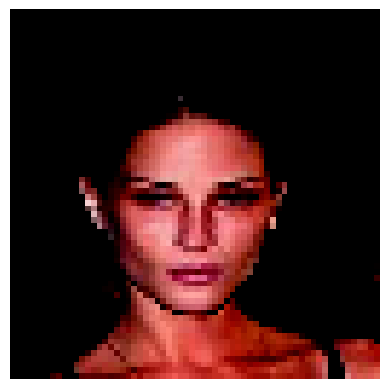

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.61327165].


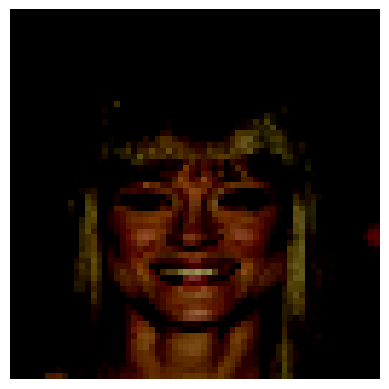

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.84782094].


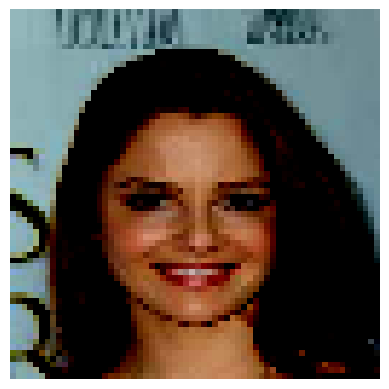

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


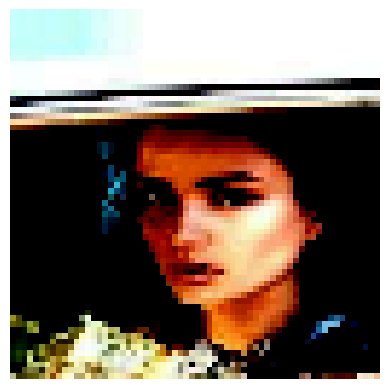

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.994897..0.99970895].


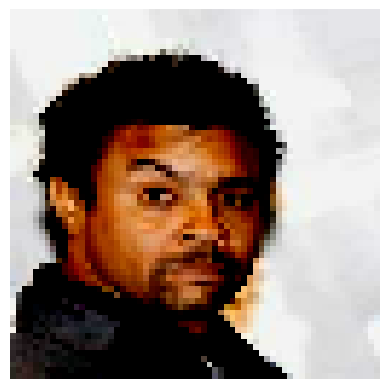

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.99851215].


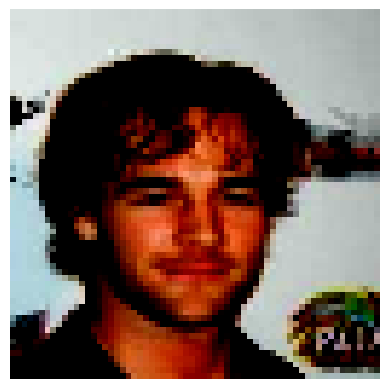

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.9480603..1.0].


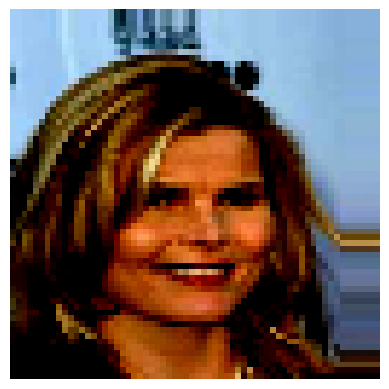

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..1.0].


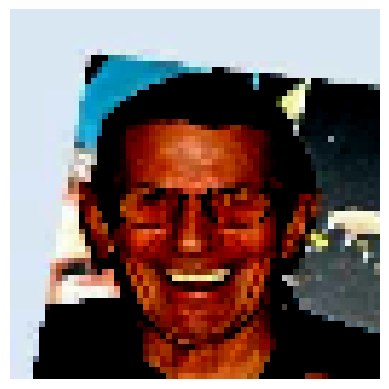

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.99467105..1.0].


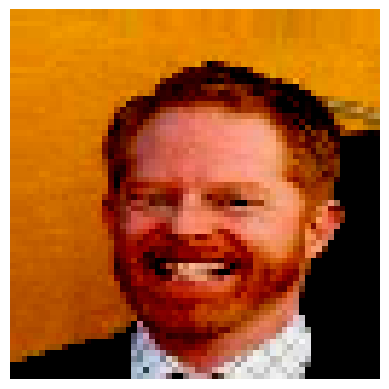

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.0..0.9972369].


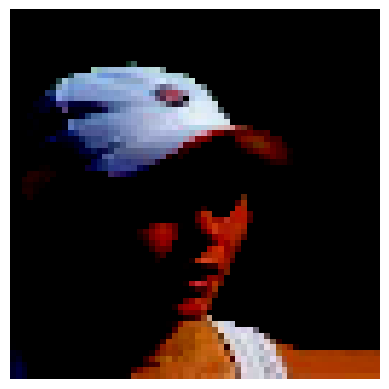

2024-10-27 13:46:15.385776: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [6]:
sample = train.take(1)
for img in sample:
    for i in range(10):
        plt.imshow(img[i])
        plt.axis("off")
        plt.show()


In [7]:
critic_input = layers.Input(shape=(64, 64, 3))
x = layers.Conv2D(64, kernel_size=4, strides=2, padding="same")(critic_input)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2D(128, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU()(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(256, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(512, kernel_size=4, strides=2, padding="same")(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Dropout(0.3)(x)
x = layers.Conv2D(1, kernel_size=4, strides=1, padding="valid")(x)
critic_output = layers.Flatten()(x)

critic = models.Model(critic_input, critic_output)
critic.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 64, 64, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 32, 32, 64)     │         3,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 16, 16, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 8, 8, 256)      │       524,544 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 4, 4, 512)      │     2,097,664 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 1, 1, 1)        │         8,193 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 1)              │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,764,737 (10.55 MB)

 Trainable params: 2,764,737 (10.55 MB)

 Non-trainable params: 0 (0.00 B)

In [8]:
generator_input = layers.Input(shape=(128,))
x = layers.Reshape((1, 1, 128))(generator_input)
x = layers.Conv2DTranspose(
    512, kernel_size=4, strides=1, padding="valid", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    256, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    128, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
x = layers.Conv2DTranspose(
    64, kernel_size=4, strides=2, padding="same", use_bias=False
)(x)
x = layers.BatchNormalization(momentum=0.9)(x)
x = layers.LeakyReLU(0.2)(x)
generator_output = layers.Conv2DTranspose(
    3, kernel_size=4, strides=2, padding="same", activation="tanh"
)(x)
generator = models.Model(generator_input, generator_output)
generator.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 1, 1, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 4, 4, 512)      │     1,048,576 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 4, 4, 512)      │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 8, 8, 256)      │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 8, 8, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8, 8, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 16, 16, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 16, 16, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 16, 16, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_3              │ (None, 32, 32, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_4              │ (None, 64, 64, 3)      │         3,075 │
│ (Conv2DTranspose)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,808,003 (14.53 MB)

 Trainable params: 3,806,083 (14.52 MB)

 Non-trainable params: 1,920 (7.50 KB)

In [10]:
class WGANGP(models.Model):
    def __init__(self, critic, generator, latent_dim, critic_steps, gp_weight):
        super(WGANGP, self).__init__()
        self.critic = critic
        self.generator = generator
        self.latent_dim = latent_dim
        self.critic_steps = critic_steps
        self.gp_weight = gp_weight

    def compile(self, c_optimizer, g_optimizer):
        super(WGANGP, self).compile()
        self.c_optimizer = c_optimizer
        self.g_optimizer = g_optimizer
        self.c_wass_loss_metric = metrics.Mean(name="c_wass_loss")
        self.c_gp_metric = metrics.Mean(name="c_gp")
        self.c_loss_metric = metrics.Mean(name="c_loss")
        self.g_loss_metric = metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [
            self.c_loss_metric,
            self.c_wass_loss_metric,
            self.c_gp_metric,
            self.g_loss_metric,
        ]

    def gradient_penalty(self, batch_size, real_images, fake_images):
        alpha = tf.random.normal([batch_size, 1, 1, 1], 0.0, 1.0)
        diff = fake_images - real_images
        interpolated = real_images + alpha * diff

        with tf.GradientTape() as gp_tape:
            gp_tape.watch(interpolated)
            pred = self.critic(interpolated, training=True)

        grads = gp_tape.gradient(pred, [interpolated])[0]
        norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gp = tf.reduce_mean((norm - 1.0) ** 2)
        return gp

    def train_step(self, real_images):
        batch_size = tf.shape(real_images)[0]

        for i in range(self.critic_steps):
            random_latent_vectors = tf.random.normal(
                shape=(batch_size, self.latent_dim)
            )

            with tf.GradientTape() as tape:
                fake_images = self.generator(
                    random_latent_vectors, training=True
                )
                fake_predictions = self.critic(fake_images, training=True)
                real_predictions = self.critic(real_images, training=True)

                c_wass_loss = tf.reduce_mean(fake_predictions) - tf.reduce_mean(
                    real_predictions
                )
                c_gp = self.gradient_penalty(
                    batch_size, real_images, fake_images
                )
                c_loss = c_wass_loss + c_gp * self.gp_weight

            c_gradient = tape.gradient(c_loss, self.critic.trainable_variables)
            self.c_optimizer.apply_gradients(
                zip(c_gradient, self.critic.trainable_variables)
            )

        random_latent_vectors = tf.random.normal(
            shape=(batch_size, self.latent_dim)
        )
        with tf.GradientTape() as tape:
            fake_images = self.generator(random_latent_vectors, training=True)
            fake_predictions = self.critic(fake_images, training=True)
            g_loss = -tf.reduce_mean(fake_predictions)

        gen_gradient = tape.gradient(g_loss, self.generator.trainable_variables)
        self.g_optimizer.apply_gradients(
            zip(gen_gradient, self.generator.trainable_variables)
        )

        self.c_loss_metric.update_state(c_loss)
        self.c_wass_loss_metric.update_state(c_wass_loss)
        self.c_gp_metric.update_state(c_gp)
        self.g_loss_metric.update_state(g_loss)

        return {m.name: m.result() for m in self.metrics}

In [70]:
# GAN 만들기
wgangp = WGANGP(
    critic=critic,
    generator=generator,
    latent_dim=128,
    critic_steps=3,
    gp_weight=10.0,
)

In [71]:
# GAN 컴파일
wgangp.compile(
    c_optimizer=optimizers.Adam(
        learning_rate=0.0002, beta_1=0.5, beta_2=0.9
    ),
    g_optimizer=optimizers.Adam(
        learning_rate=0.0002, beta_1=0.5, beta_2=0.9
    ),
)

In [72]:
from PIL import Image

tensorboard_callback = callbacks.TensorBoard(log_dir="./logs")


class ImageGenerator(callbacks.Callback):
    def __init__(self, num_img, latent_dim):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        if epoch % 10 != 0: # 출력 횟수를 줄이기 위해
            return
        random_latent_vectors = tf.random.normal(
            shape=(self.num_img, self.latent_dim)
        )
        generated_images = self.model.generator(random_latent_vectors)
        generated_images = generated_images * 127.5 + 127.5
        generated_images = generated_images.numpy()
        
        # 이미지를 가로로 붙이기
        concatenated_image = np.hstack(generated_images.astype(np.uint8))

        # 가로로 붙인 이미지 출력
        plt.figure(figsize=(20, 5))
        plt.imshow(concatenated_image)
        plt.axis("off")
        plt.show()

In [73]:
# 모델 저장 체크포인트 만들기
model_checkpoint_callback = callbacks.ModelCheckpoint(
    filepath="./checkpoint/checkpoint.weights.h5",
    save_weights_only=True,
    save_freq="epoch",
    verbose=0,
)

Epoch 1/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - c_gp: 0.0540 - c_loss: -4.8259 - c_wass_loss: -5.3662 - g_loss: -8.7595 

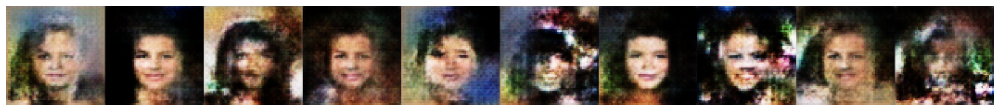

5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0530 - c_loss: -4.8580 - c_wass_loss: -5.3878 - g_loss: -4.8819
Epoch 2/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 18s 3s/step - c_gp: 0.0295 - c_loss: -4.2486 - c_wass_loss: -4.5438 - g_loss: 22.0547
Epoch 3/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0401 - c_loss: -4.7200 - c_wass_loss: -5.1207 - g_loss: -44.9748
Epoch 4/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0336 - c_loss: -4.5397 - c_wass_loss: -4.8754 - g_loss: -74.5730
Epoch 5/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0500 - c_loss: -3.8332 - c_wass_loss: -4.3334 - g_loss: -49.2364
Epoch 6/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0460 - c_loss: -3.3190 - c_wass_loss: -3.7790 - g_loss: -62.4364
Epoch 7/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0546 - c_loss: -4.8382 - c_wass_loss: -5.3845 - g_loss: 7.1981
Epoch 8/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0333 - c_loss: -4.9812 - c_wass_loss: -5.3137 - g_loss: 55.0207
Epoch 9/200
5/5 ━━━━━━━━━

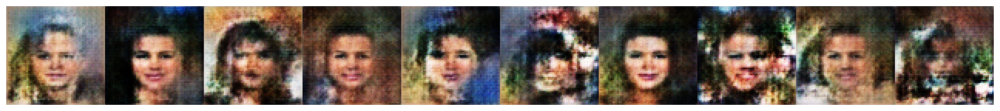

5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0631 - c_loss: -5.5564 - c_wass_loss: -6.1877 - g_loss: -54.4254
Epoch 12/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0553 - c_loss: -4.9950 - c_wass_loss: -5.5477 - g_loss: 23.7255
Epoch 13/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0194 - c_loss: -1.4116 - c_wass_loss: -1.6053 - g_loss: 17.4916
Epoch 14/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0741 - c_loss: -5.7962 - c_wass_loss: -6.5377 - g_loss: 17.5800
Epoch 15/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0398 - c_loss: -4.3068 - c_wass_loss: -4.7046 - g_loss: -28.1881
Epoch 16/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0775 - c_loss: -3.8692 - c_wass_loss: -4.6443 - g_loss: -66.7046
Epoch 17/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0617 - c_loss: -4.9316 - c_wass_loss: -5.5487 - g_loss: -52.6439
Epoch 18/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0478 - c_loss: -3.8261 - c_wass_loss: -4.3044 - g_loss: -73.9437
Epoch 19/200
5/5

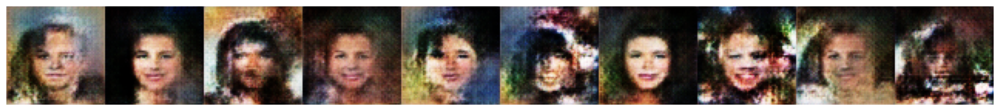

5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0291 - c_loss: -5.3647 - c_wass_loss: -5.6561 - g_loss: -60.8842
Epoch 22/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0317 - c_loss: -3.2795 - c_wass_loss: -3.5965 - g_loss: -36.9222
Epoch 23/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0368 - c_loss: -1.8255 - c_wass_loss: -2.1936 - g_loss: -81.3802
Epoch 24/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0408 - c_loss: -5.1607 - c_wass_loss: -5.5688 - g_loss: -45.0970
Epoch 25/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0163 - c_loss: -3.4192 - c_wass_loss: -3.5818 - g_loss: 10.6242
Epoch 26/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0343 - c_loss: -3.9771 - c_wass_loss: -4.3198 - g_loss: 7.7166
Epoch 27/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0234 - c_loss: -4.8593 - c_wass_loss: -5.0930 - g_loss: -49.8551
Epoch 28/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0557 - c_loss: -3.2982 - c_wass_loss: -3.8550 - g_loss: -75.0087
Epoch 29/200
5/5

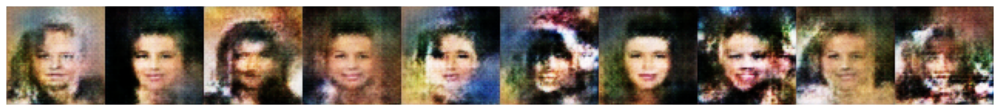

5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0250 - c_loss: -3.1265 - c_wass_loss: -3.3766 - g_loss: -49.3390
Epoch 32/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0321 - c_loss: -4.9301 - c_wass_loss: -5.2511 - g_loss: -36.1947
Epoch 33/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0301 - c_loss: -5.3764 - c_wass_loss: -5.6777 - g_loss: -36.3896
Epoch 34/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0271 - c_loss: -2.5330 - c_wass_loss: -2.8043 - g_loss: -61.1239
Epoch 35/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0374 - c_loss: -5.6019 - c_wass_loss: -5.9760 - g_loss: -42.2856
Epoch 36/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0216 - c_loss: -3.7947 - c_wass_loss: -4.0105 - g_loss: -28.4282
Epoch 37/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0321 - c_loss: -2.2959 - c_wass_loss: -2.6168 - g_loss: 26.9212
Epoch 38/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0487 - c_loss: -4.6083 - c_wass_loss: -5.0950 - g_loss: -6.5061
Epoch 39/200
5/

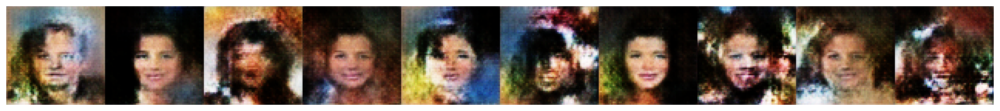

5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0399 - c_loss: -4.3833 - c_wass_loss: -4.7827 - g_loss: -70.7151
Epoch 42/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0187 - c_loss: -1.3840 - c_wass_loss: -1.5710 - g_loss: -35.0524
Epoch 43/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0426 - c_loss: -3.4108 - c_wass_loss: -3.8372 - g_loss: -3.6731
Epoch 44/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0434 - c_loss: -3.9919 - c_wass_loss: -4.4259 - g_loss: 39.5506
Epoch 45/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0227 - c_loss: -5.0829 - c_wass_loss: -5.3099 - g_loss: 14.1055
Epoch 46/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0365 - c_loss: -4.6027 - c_wass_loss: -4.9679 - g_loss: -20.0020
Epoch 47/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0613 - c_loss: -4.1352 - c_wass_loss: -4.7484 - g_loss: -78.1730
Epoch 48/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0189 - c_loss: -5.3212 - c_wass_loss: -5.5100 - g_loss: -47.5817
Epoch 49/200
5/5

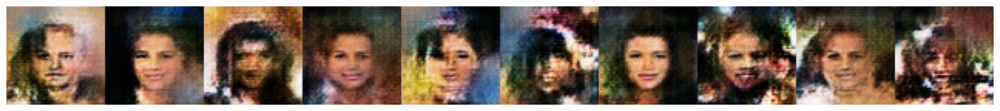

5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0342 - c_loss: -1.8717 - c_wass_loss: -2.2137 - g_loss: -23.5657
Epoch 52/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0302 - c_loss: -1.1218 - c_wass_loss: -1.4242 - g_loss: -76.2265
Epoch 53/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0307 - c_loss: -3.3278 - c_wass_loss: -3.6348 - g_loss: -82.4832
Epoch 54/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0430 - c_loss: -4.8819 - c_wass_loss: -5.3120 - g_loss: -56.3570
Epoch 55/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0311 - c_loss: -2.9094 - c_wass_loss: -3.2201 - g_loss: -48.1105
Epoch 56/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0591 - c_loss: -7.5368 - c_wass_loss: -8.1282 - g_loss: -37.7240
Epoch 57/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0279 - c_loss: -1.4820 - c_wass_loss: -1.7606 - g_loss: -24.1460
Epoch 58/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0334 - c_loss: -2.3148 - c_wass_loss: -2.6488 - g_loss: -66.8326
Epoch 59/200


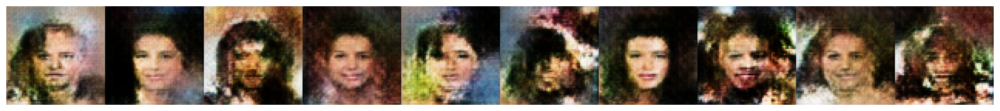

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0286 - c_loss: -4.8629 - c_wass_loss: -5.1494 - g_loss: -21.1258
Epoch 62/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0444 - c_loss: -6.5182 - c_wass_loss: -6.9619 - g_loss: -62.4395
Epoch 63/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0168 - c_loss: -1.1375 - c_wass_loss: -1.3056 - g_loss: -66.1054
Epoch 64/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0205 - c_loss: -2.3959 - c_wass_loss: -2.6005 - g_loss: -61.2065
Epoch 65/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0239 - c_loss: -4.3034 - c_wass_loss: -4.5423 - g_loss: -55.1132
Epoch 66/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0194 - c_loss: -2.8964 - c_wass_loss: -3.0905 - g_loss: -43.5719
Epoch 67/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0271 - c_loss: -1.9555 - c_wass_loss: -2.2267 - g_loss: -37.8434
Epoch 68/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0173 - c_loss: 0.1683 - c_wass_loss: -0.0043 - g_loss: -23.4206
Epoch 69/200
5

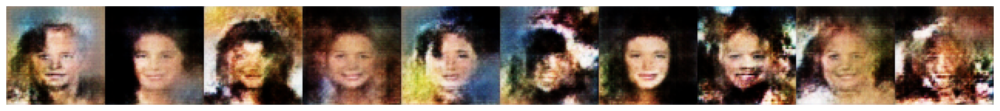

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0402 - c_loss: -3.8343 - c_wass_loss: -4.2359 - g_loss: 19.6077
Epoch 72/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0206 - c_loss: -2.5260 - c_wass_loss: -2.7319 - g_loss: 34.0588
Epoch 73/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0283 - c_loss: -3.4339 - c_wass_loss: -3.7171 - g_loss: 37.9232
Epoch 74/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0175 - c_loss: -0.8406 - c_wass_loss: -1.0161 - g_loss: 25.1709
Epoch 75/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0257 - c_loss: -3.3679 - c_wass_loss: -3.6249 - g_loss: 17.9013
Epoch 76/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0084 - c_loss: -2.0207 - c_wass_loss: -2.1050 - g_loss: -22.1218
Epoch 77/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0419 - c_loss: -2.7101 - c_wass_loss: -3.1289 - g_loss: -36.9948
Epoch 78/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0405 - c_loss: -3.8905 - c_wass_loss: -4.2955 - g_loss: -58.7512
Epoch 79/200
5/5 ━

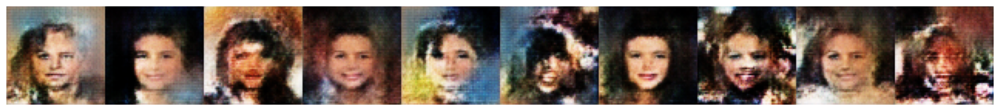

5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - c_gp: 0.0198 - c_loss: -2.4293 - c_wass_loss: -2.6275 - g_loss: -92.6233
Epoch 82/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0126 - c_loss: -2.4645 - c_wass_loss: -2.5906 - g_loss: -45.8211
Epoch 83/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0233 - c_loss: -2.4828 - c_wass_loss: -2.7161 - g_loss: -50.2090
Epoch 84/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0333 - c_loss: -0.6461 - c_wass_loss: -0.9795 - g_loss: -46.0191
Epoch 85/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0139 - c_loss: -4.4519 - c_wass_loss: -4.5913 - g_loss: 34.5831
Epoch 86/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - c_gp: 0.0412 - c_loss: -2.7258 - c_wass_loss: -3.1373 - g_loss: 45.7165
Epoch 87/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0681 - c_loss: -2.3925 - c_wass_loss: -3.0735 - g_loss: 26.8862
Epoch 88/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0493 - c_loss: -5.0341 - c_wass_loss: -5.5274 - g_loss: -39.8067
Epoch 89/200
5/5

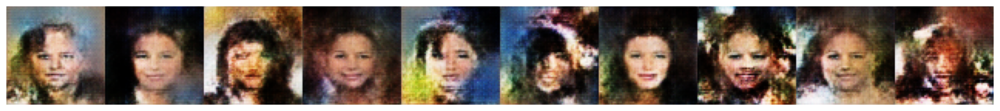

5/5 ━━━━━━━━━━━━━━━━━━━━ 16s 3s/step - c_gp: 0.0340 - c_loss: -7.3242 - c_wass_loss: -7.6639 - g_loss: -76.2719
Epoch 92/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 16s 3s/step - c_gp: 0.0193 - c_loss: -3.1975 - c_wass_loss: -3.3908 - g_loss: -48.8411
Epoch 93/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - c_gp: 0.0270 - c_loss: -4.5944 - c_wass_loss: -4.8648 - g_loss: -45.4580
Epoch 94/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - c_gp: 0.0313 - c_loss: -5.1776 - c_wass_loss: -5.4909 - g_loss: -55.2887
Epoch 95/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0060 - c_loss: -1.4466 - c_wass_loss: -1.5062 - g_loss: 11.6939
Epoch 96/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0126 - c_loss: -3.0417 - c_wass_loss: -3.1678 - g_loss: -22.0414
Epoch 97/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0381 - c_loss: -1.9813 - c_wass_loss: -2.3623 - g_loss: -52.8785
Epoch 98/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0222 - c_loss: -2.6212 - c_wass_loss: -2.8434 - g_loss: -53.9546
Epoch 99/200
5

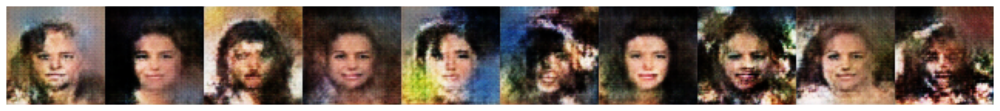

5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0927 - c_loss: -4.4258 - c_wass_loss: -5.3526 - g_loss: 85.7778
Epoch 102/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0379 - c_loss: -3.5291 - c_wass_loss: -3.9081 - g_loss: 100.2318
Epoch 103/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0486 - c_loss: -7.7422 - c_wass_loss: -8.2286 - g_loss: 112.9396
Epoch 104/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0214 - c_loss: -3.0772 - c_wass_loss: -3.2914 - g_loss: 74.5985
Epoch 105/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0106 - c_loss: -1.5725 - c_wass_loss: -1.6782 - g_loss: -54.6579
Epoch 106/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - c_gp: 0.0256 - c_loss: -0.2651 - c_wass_loss: -0.5210 - g_loss: -85.1536
Epoch 107/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0106 - c_loss: 0.6236 - c_wass_loss: 0.5171 - g_loss: -47.5436
Epoch 108/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0291 - c_loss: -3.2146 - c_wass_loss: -3.5058 - g_loss: -79.2969
Epoch 109/

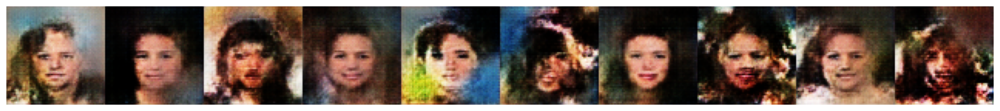

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0233 - c_loss: -4.2620 - c_wass_loss: -4.4954 - g_loss: -63.4022
Epoch 112/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0234 - c_loss: -2.8820 - c_wass_loss: -3.1162 - g_loss: -9.6495
Epoch 113/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0282 - c_loss: -0.9196 - c_wass_loss: -1.2018 - g_loss: -118.6100
Epoch 114/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0157 - c_loss: -0.9897 - c_wass_loss: -1.1466 - g_loss: -97.1310
Epoch 115/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0098 - c_loss: -2.2048 - c_wass_loss: -2.3029 - g_loss: -82.6575
Epoch 116/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0244 - c_loss: 0.6561 - c_wass_loss: 0.4126 - g_loss: -100.0328
Epoch 117/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0139 - c_loss: -2.8280 - c_wass_loss: -2.9666 - g_loss: -76.0269
Epoch 118/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0210 - c_loss: -0.6043 - c_wass_loss: -0.8146 - g_loss: -45.2917
Epoch 1

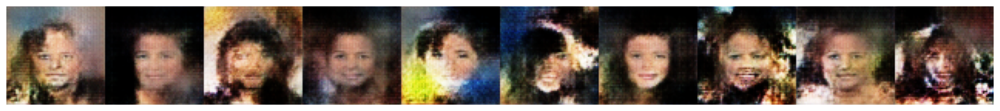

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0146 - c_loss: -1.0711 - c_wass_loss: -1.2174 - g_loss: -46.0130
Epoch 122/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0741 - c_loss: -7.0561 - c_wass_loss: -7.7969 - g_loss: -1.2029
Epoch 123/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0224 - c_loss: -2.6419 - c_wass_loss: -2.8654 - g_loss: -13.6355
Epoch 124/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0385 - c_loss: -4.6117 - c_wass_loss: -4.9971 - g_loss: -60.5632
Epoch 125/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0239 - c_loss: -3.1130 - c_wass_loss: -3.3520 - g_loss: -36.8168
Epoch 126/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0185 - c_loss: -4.4929 - c_wass_loss: -4.6777 - g_loss: 8.2095
Epoch 127/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0541 - c_loss: 0.8451 - c_wass_loss: 0.3038 - g_loss: 80.1844
Epoch 128/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0240 - c_loss: 3.9127 - c_wass_loss: 3.6732 - g_loss: 81.2637
Epoch 129/200
5

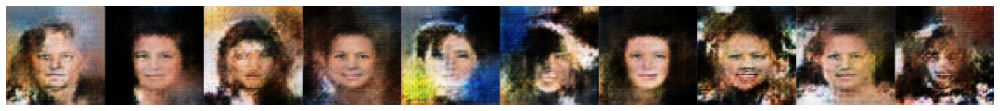

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0118 - c_loss: -3.6796 - c_wass_loss: -3.7972 - g_loss: 2.5400
Epoch 132/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0301 - c_loss: -4.8153 - c_wass_loss: -5.1158 - g_loss: 16.5497
Epoch 133/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0187 - c_loss: -0.6859 - c_wass_loss: -0.8730 - g_loss: 12.4774
Epoch 134/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0325 - c_loss: -4.5574 - c_wass_loss: -4.8827 - g_loss: -56.1318
Epoch 135/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0151 - c_loss: 1.1879 - c_wass_loss: 1.0367 - g_loss: -118.7907
Epoch 136/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0184 - c_loss: 3.8471 - c_wass_loss: 3.6635 - g_loss: -115.7886
Epoch 137/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0155 - c_loss: -5.6252 - c_wass_loss: -5.7805 - g_loss: -76.1752
Epoch 138/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0131 - c_loss: -4.3001 - c_wass_loss: -4.4312 - g_loss: -58.6788
Epoch 139/20

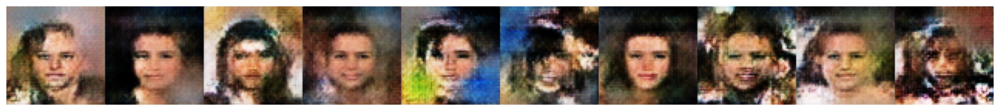

5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0149 - c_loss: -2.2877 - c_wass_loss: -2.4362 - g_loss: -7.3259
Epoch 142/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 56s 14s/step - c_gp: 0.0158 - c_loss: -2.9337 - c_wass_loss: -3.0913 - g_loss: -0.7689
Epoch 143/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0293 - c_loss: -3.7267 - c_wass_loss: -4.0202 - g_loss: 63.0771
Epoch 144/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 21s 1s/step - c_gp: 0.0242 - c_loss: -2.4709 - c_wass_loss: -2.7125 - g_loss: 54.6692
Epoch 145/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 81s 1s/step - c_gp: 0.0214 - c_loss: -3.8149 - c_wass_loss: -4.0292 - g_loss: 70.7512
Epoch 146/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - c_gp: 0.0137 - c_loss: -2.0325 - c_wass_loss: -2.1698 - g_loss: 69.0786
Epoch 147/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 13s 3s/step - c_gp: 0.0225 - c_loss: 1.7106 - c_wass_loss: 1.4861 - g_loss: 55.0265
Epoch 148/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 158s 39s/step - c_gp: 0.0280 - c_loss: -4.9577 - c_wass_loss: -5.2374 - g_loss: 49.3983
Epoch 149/200

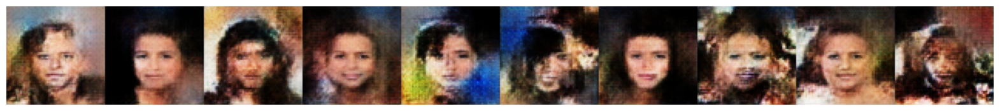

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0232 - c_loss: -1.4833 - c_wass_loss: -1.7152 - g_loss: -97.7665
Epoch 152/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0157 - c_loss: -1.4321 - c_wass_loss: -1.5888 - g_loss: -77.8777
Epoch 153/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0157 - c_loss: -0.7513 - c_wass_loss: -0.9085 - g_loss: -60.5544
Epoch 154/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0214 - c_loss: -3.8832 - c_wass_loss: -4.0968 - g_loss: -14.9017
Epoch 155/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0117 - c_loss: -3.8820 - c_wass_loss: -3.9988 - g_loss: -36.7635
Epoch 156/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0255 - c_loss: -2.0955 - c_wass_loss: -2.3502 - g_loss: -46.7041
Epoch 157/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0438 - c_loss: -4.6828 - c_wass_loss: -5.1208 - g_loss: -73.4622
Epoch 158/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0538 - c_loss: -3.3226 - c_wass_loss: -3.8603 - g_loss: -101.0239
Epoch 159/200

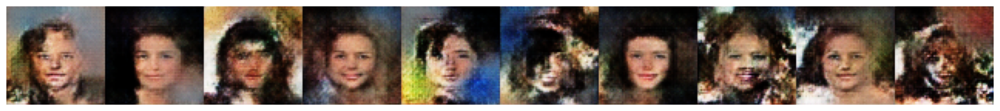

5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0153 - c_loss: 0.1472 - c_wass_loss: -0.0056 - g_loss: 5.5634
Epoch 162/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0234 - c_loss: 0.9448 - c_wass_loss: 0.7106 - g_loss: 21.1342
Epoch 163/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0145 - c_loss: -3.2503 - c_wass_loss: -3.3952 - g_loss: -11.2281
Epoch 164/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0454 - c_loss: -1.6963 - c_wass_loss: -2.1508 - g_loss: -81.3554
Epoch 165/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - c_gp: 0.0101 - c_loss: -1.2393 - c_wass_loss: -1.3407 - g_loss: -111.4243
Epoch 166/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - c_gp: 0.0242 - c_loss: -3.7809 - c_wass_loss: -4.0225 - g_loss: -120.5249
Epoch 167/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0187 - c_loss: -0.4029 - c_wass_loss: -0.5897 - g_loss: -62.0633
Epoch 168/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step - c_gp: 0.0253 - c_loss: -2.3341 - c_wass_loss: -2.5867 - g_loss: -74.1088
Epoch 169/200
5

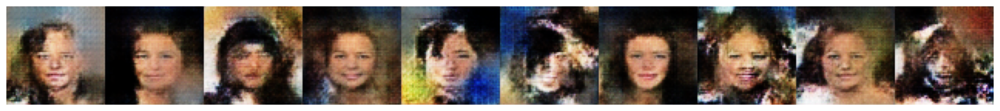

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - c_gp: 0.0296 - c_loss: -4.4006 - c_wass_loss: -4.6966 - g_loss: -47.4261
Epoch 172/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0139 - c_loss: -3.0411 - c_wass_loss: -3.1800 - g_loss: -42.5792
Epoch 173/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0225 - c_loss: -2.8936 - c_wass_loss: -3.1187 - g_loss: -10.3409
Epoch 174/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0491 - c_loss: -4.5895 - c_wass_loss: -5.0805 - g_loss: -45.1707
Epoch 175/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 61s 15s/step - c_gp: 0.0264 - c_loss: -6.0975 - c_wass_loss: -6.3616 - g_loss: -71.0575
Epoch 176/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0150 - c_loss: -3.1847 - c_wass_loss: -3.3344 - g_loss: -63.8299
Epoch 177/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0255 - c_loss: -0.2741 - c_wass_loss: -0.5290 - g_loss: -39.8552
Epoch 178/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0192 - c_loss: -3.2129 - c_wass_loss: -3.4049 - g_loss: 34.0635
Epoch 179/200

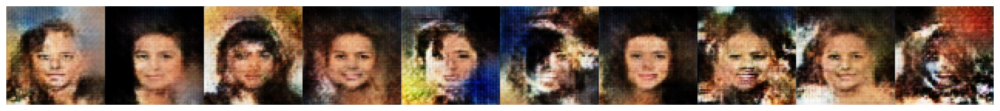

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0183 - c_loss: -3.8275 - c_wass_loss: -4.0107 - g_loss: 41.1556
Epoch 182/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0486 - c_loss: -3.9181 - c_wass_loss: -4.4043 - g_loss: 52.0194
Epoch 183/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0096 - c_loss: -1.2586 - c_wass_loss: -1.3548 - g_loss: -1.8141
Epoch 184/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0121 - c_loss: -0.9850 - c_wass_loss: -1.1065 - g_loss: -54.5947
Epoch 185/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - c_gp: 0.0194 - c_loss: -3.5634 - c_wass_loss: -3.7572 - g_loss: -90.6504
Epoch 186/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step - c_gp: 0.0223 - c_loss: -4.2306 - c_wass_loss: -4.4533 - g_loss: -124.5739
Epoch 187/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 33s 6s/step - c_gp: 0.0229 - c_loss: -3.7935 - c_wass_loss: -4.0229 - g_loss: -95.7549
Epoch 188/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 17s 3s/step - c_gp: 0.0144 - c_loss: -2.6043 - c_wass_loss: -2.7481 - g_loss: -8.9947
Epoch 189/200


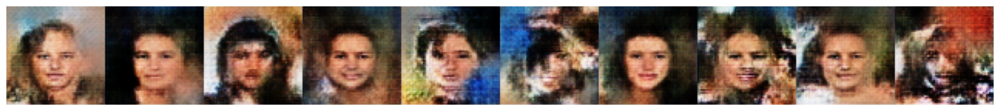

5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0098 - c_loss: -0.1078 - c_wass_loss: -0.2063 - g_loss: -9.7699
Epoch 192/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0241 - c_loss: -2.8235 - c_wass_loss: -3.0644 - g_loss: -12.5320
Epoch 193/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0096 - c_loss: -2.8875 - c_wass_loss: -2.9836 - g_loss: 7.2271
Epoch 194/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0109 - c_loss: -3.6613 - c_wass_loss: -3.7701 - g_loss: -15.8252
Epoch 195/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 7s 1s/step - c_gp: 0.0533 - c_loss: -5.1094 - c_wass_loss: -5.6424 - g_loss: -62.3590
Epoch 196/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 8s 2s/step - c_gp: 0.0259 - c_loss: -4.3948 - c_wass_loss: -4.6533 - g_loss: -124.2015
Epoch 197/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - c_gp: 0.0291 - c_loss: -4.0585 - c_wass_loss: -4.3492 - g_loss: -91.4000
Epoch 198/200
5/5 ━━━━━━━━━━━━━━━━━━━━ 16s 3s/step - c_gp: 0.0261 - c_loss: -2.1974 - c_wass_loss: -2.4581 - g_loss: -78.9318
Epoch 199/200


In [16]:
wgangp.fit(
    train,
    epochs=200,
    steps_per_epoch=5,
    callbacks=[
        model_checkpoint_callback,
        tensorboard_callback,
        ImageGenerator(num_img=10, latent_dim=128),
    ],
)

In [18]:
generator.save("./models/generator.keras")
critic.save("./models/critic.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step


array([[[[-0.3292297 , -0.40045017, -0.41667956],
         [-0.34182256, -0.461138  , -0.53157866],
         [-0.30581868, -0.47534823, -0.5362607 ],
         ...,
         [ 0.10615213,  0.11062571,  0.04756569],
         [ 0.0655141 ,  0.07032069,  0.0545651 ],
         [ 0.10215659,  0.03725114, -0.05651365]],

        [[-0.33018368, -0.39361918, -0.52025163],
         [-0.34050643, -0.5022596 , -0.602351  ],
         [-0.29009438, -0.4593679 , -0.56492174],
         ...,
         [ 0.09139667,  0.13749598,  0.08605894],
         [ 0.10744458,  0.14618503,  0.0394957 ],
         [ 0.12357125,  0.10865327, -0.01644629]],

        [[-0.34803995, -0.46969223, -0.5442004 ],
         [-0.21946758, -0.44314054, -0.54262626],
         [-0.2846706 , -0.43673664, -0.56143147],
         ...,
         [ 0.13914593,  0.1914561 ,  0.10326385],
         [ 0.07814415,  0.14335325,  0.04258641],
         [ 0.1442846 ,  0.07512748,  0.01724437]],

        ...,

        [[-0.49260634, -0.43950993, -0

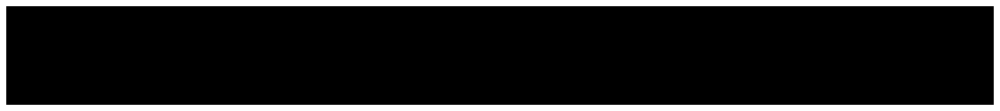

In [22]:
z_sample = np.random.normal(size=(10, 128))
imgs = wgangp.generator.predict(z_sample)
imgs = (imgs * 127.5 + 127.5).astype(np.uint8)

# 이미지를 가로로 붙이기
concatenated_image = np.hstack(imgs)

# 가로로 붙인 이미지 출력
plt.figure(figsize=(20, 5))
plt.imshow(concatenated_image)
plt.axis("off")
plt.show()